In [1]:
# # FOR CUstom Dataset

# !pip install gdown
# import gdown
# import zipfile

# url = 'https://drive.google.com/uc?id=1dcFCOdPuXeZnmVYstc0Bo-p0xMq20GMG'
# output = 'HR_images.zip'
# gdown.download(url, output, quiet=False) 

# url = 'https://drive.google.com/uc?id=1eWcQr4fnPvKl7vCGUcAjiYEzCL5S_lCc'
# output = 'LR_images.zip'
# gdown.download(url, output, quiet=False) 

# zip_ref = zipfile.ZipFile('HR_images.zip', 'r')
# zip_ref.extractall('HR_Images')
# zip_ref.close()

# zip_ref = zipfile.ZipFile('LR_images.zip', 'r')
# zip_ref.extractall('LR_Images')
# zip_ref.close()

In [2]:
from PIL import Image
import os
import pathlib
import time
from torch.utils.data import Dataset, DataLoader 
import glob
import tqdm
import random
import torch.nn.functional as F
import math
import gc
import torch
from torch import Tensor
from torch import nn
import torch.optim as Toptim
from torchvision.models import vgg19
from torch.autograd.variable import Variable
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import save_image, make_grid
from typing import Tuple, Dict, List

In [3]:

# for dirpath, dirnames, filenames in os.walk(data_path):
#     print(len(filenames))

In [4]:
if not os.path.exists("/kaggle/working/Images"):
    os.mkdir("/kaggle/working/Images")
if not os.path.exists("/kaggle/working/Models"):
    os.mkdir("/kaggle/working/Models")

In [5]:
class Flickr2kDataset(Dataset):
    
    def __init__(self, dir : str, transform_LR = None, transform_HR = None) -> None:
        self.paths = list(pathlib.Path(data_path).glob("*.png"))
        self.transform_LR = transform_LR
        self.transform_HR = transform_HR
    
    def load_image(self, index:int) -> Image.Image:
        image_path = self.paths[index]
        return Image.open(image_path)
    
    def __len__(self) -> int:
        return len(self.paths)
    
    def __getitem__(self, index : int) -> Tuple[torch.Tensor, torch.Tensor]:
        img = self.load_image(index)
        if self.transform_LR and self.transform_HR:
            return self.transform_LR(img), self.transform_HR(img)
        else:
            return img

In [6]:
data_LR_transforms = T.Compose([
    T.Resize((64,64)),
    T.ToTensor(),
])
data_HR_transforms = T.Compose([
    T.Resize((256,256)),
    T.ToTensor(),
])

In [7]:
data_path = pathlib.Path("/kaggle/input/flickr2k/Flickr2K/Flickr2K_HR")
Flickr2k_dataset = Flickr2kDataset(dir = data_path, transform_LR = data_LR_transforms, transform_HR = data_HR_transforms)

In [8]:
len(Flickr2k_dataset)

2650

In [9]:
def display_random_images(dataset : torch.utils.data.dataset.Dataset,
                          n: int = 1,
                          seed : int = None):
    if seed:
        random.seed(seed)
    random_samples_idx = random.sample(range(len(dataset)), k = n)
    
    
    for i , sample in enumerate(random_samples_idx):
        sample_image_LR, sample_image_HR = dataset[sample]
        
    fig = plt.figure(figsize = (16, 8))
    
    fig.add_subplot(1,2,1)
    plt.axis("off")
    plt.title(f"Image Size: {sample_image_LR.permute(1,2,0).shape}")
    plt.imshow(sample_image_LR.permute(1,2,0))
    
    fig.add_subplot(1,2,2)
    plt.axis("off")
    plt.title(f"Image Size: {sample_image_HR.permute(1,2,0).shape}")
    plt.imshow(sample_image_HR.permute(1,2,0))

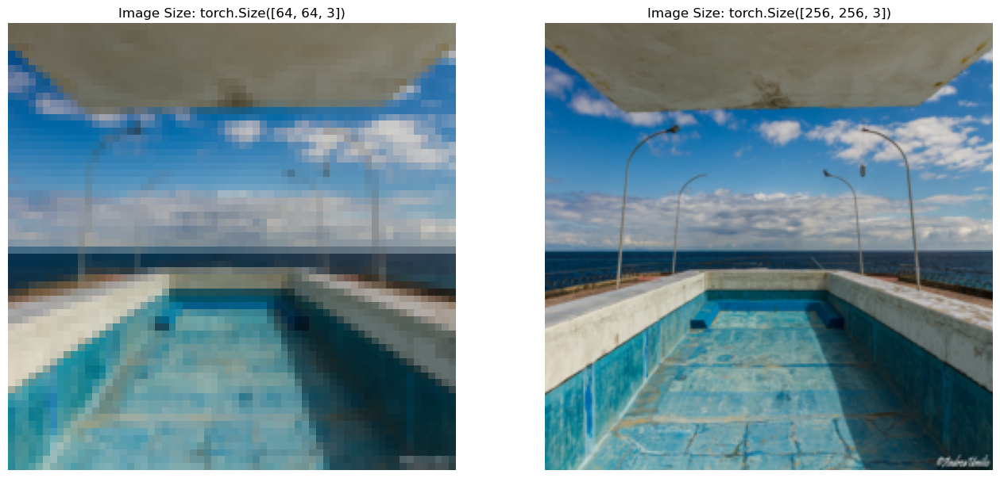

In [10]:
display_random_images(Flickr2k_dataset, seed = None)

In [11]:
epoch = 0
n_epochs = 40
batch_size = 5
lr = 0.0005
beta1 = 0.5
beta2 = 0.999
decay_epoch = 20
n_cpu = 2
hr_height = 256
hr_width = 256
channels = 3
sample_interval = 100

In [12]:
train_params = {"batch_size": batch_size, "shuffle": True, "num_workers": n_cpu}
train_dataloader = DataLoader(Flickr2k_dataset, **train_params)

In [13]:
sample_image_lr, sample_image_hr = next(iter(train_dataloader))
sample_image_lr.shape, sample_image_hr.shape

(torch.Size([5, 3, 64, 64]), torch.Size([5, 3, 256, 256]))

In [14]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [15]:
class FeatureExtracter(nn.Module):
    def __init__(self):
        super(FeatureExtracter, self).__init__()
        vgg19_model = vgg19(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(vgg19_model.features.children())[:18])

    def forward(self, img):
        return self.feature_extractor(img)


class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_features, 0.8),
            nn.PReLU(),
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_features, 0.8),
        )

    def forward(self, x):
        return x + self.conv_block(x)


class Generator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, n_residual_blocks=16):
        super(Generator, self).__init__()

        # First layer
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels, 64, kernel_size=9, stride=1, padding=4), nn.PReLU())

        # Residual blocks
        res_blocks = []
        for _ in range(n_residual_blocks):
            res_blocks.append(ResidualBlock(64))
        self.res_blocks = nn.Sequential(*res_blocks)

        # Second conv layer post residual blocks
        self.conv2 = nn.Sequential(nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1), nn.BatchNorm2d(64, 0.8))

        # Upsampling layers
        upsampling = []
        for out_features in range(2):
            upsampling += [
                # nn.Upsample(scale_factor=2),
                nn.Conv2d(64, 256, 3, 1, 1),
                nn.BatchNorm2d(256),
                nn.PixelShuffle(upscale_factor=2),
                nn.PReLU(),
            ]
        self.upsampling = nn.Sequential(*upsampling)

        # Final output layer
        self.conv3 = nn.Sequential(nn.Conv2d(64, out_channels, kernel_size=9, stride=1, padding=4), nn.Tanh())

    def forward(self, x):
        out1 = self.conv1(x)
        out = self.res_blocks(out1)
        out2 = self.conv2(out)
        out = torch.add(out1, out2)
        out = self.upsampling(out)
        out = self.conv3(out)
        return out


class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()

        self.input_shape = input_shape
        in_channels, in_height, in_width = self.input_shape
        patch_h, patch_w = int(in_height / 2 ** 4), int(in_width / 2 ** 4)
        self.output_shape = (1, patch_h, patch_w)

        def discriminator_block(in_filters, out_filters, first_block=False):
            layers = []
            layers.append(nn.Conv2d(in_filters, out_filters, kernel_size=3, stride=1, padding=1))
            if not first_block:
                layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            layers.append(nn.Conv2d(out_filters, out_filters, kernel_size=3, stride=2, padding=1))
            layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        layers = []
        in_filters = in_channels
        for i, out_filters in enumerate([64, 128, 256, 512]):
            layers.extend(discriminator_block(in_filters, out_filters, first_block=(i == 0)))
            in_filters = out_filters

        layers.append(nn.Conv2d(out_filters, 1, kernel_size=3, stride=1, padding=1))

        self.model = nn.Sequential(*layers)

    def forward(self, img):
        return self.model(img)

In [16]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0.0)

In [17]:
# def weights_init_normal(m):
#     classname = m.__class__.__name__
#     if classname.find('Conv') != -1:
#         nn.init.normal_(m.weight.data, 0.0, 0.02)
#     elif classname.find('BatchNorm2d') != -1:
#         nn.init.normal_(m.weight.data, 1.0, 0.02)
#         nn.init.constant_(m.bias.data, 0.0)

# class ResidualBlock(nn.Module):
#     def __init__(self, n_output=64, k_size=3, stride=1, padding=1):
#         super(ResidualBlock, self).__init__()
#         self.model = nn.Sequential(
#             nn.Conv2d(n_output, n_output, k_size, stride, padding),
#             nn.BatchNorm2d(n_output),
#             nn.PReLU(),
#             nn.Conv2d(n_output, n_output, k_size, stride, padding),
#             nn.BatchNorm2d(n_output)
#         )

#     def forward(self, x):
#         return x + self.model(x)

# class ShuffleBlock(nn.Module):
#     def __init__(self, n_input, n_output, k_size=3, stride=1, padding=1):
#         super(ShuffleBlock, self).__init__()
#         self.model = nn.Sequential(
#             nn.Conv2d(n_input, n_output, k_size, stride, padding),  # N, 256, H, W
#             nn.PixelShuffle(2),  # N, 64, 2H, 2W
#             nn.PReLU(),
#         )
#         '''
#         Input: :math:`(N, C * upscale_factor^2, H, W)`
#         Output: :math:`(N, C, H * upscale_factor, W * upscale_factor)`
#         '''

#     def forward(self, x):
#         return self.model(x)


# # n_fmap = number of feature maps,
# # B = number of cascaded residual blocks.
# class Generator(nn.Module):
#     def __init__(self, n_input=3, n_output=3, n_fmap=64, B=16):
#         super(Generator, self).__init__()

#         self.l1 = nn.Sequential(
#             nn.Conv2d(n_input, n_fmap, 9, 1, 4),
#             nn.PReLU(),
#         )

#         # A cascaded of B residual blocks.
#         self.R = []
#         for _ in range(B):
#             self.R.append(ResidualBlock(n_fmap))
#         self.R = nn.Sequential(*self.R)

#         self.l2 = nn.Sequential(
#             nn.Conv2d(n_fmap, n_fmap, 3, 1, 1),
#             nn.BatchNorm2d(n_fmap),
#             nn.PReLU()
#         )

#         self.px = nn.Sequential(
#             ShuffleBlock(64, 256),
#             ShuffleBlock(64, 256),
#         )

#         self.conv_final = nn.Sequential(
#             nn.Conv2d(64, n_output, 9, 1, 4),
#             nn.Tanh(),
#         )


#     def forward(self, img_in):
#         out_1 = self.l1(img_in)
#         out_2 = self.R(out_1)
#         out_3 = out_1 + self.l2(out_2)
#         out_4 = self.px(out_3)
#         return self.conv_final(out_4)


# class Discriminator(nn.Module):
#     def __init__(self, lr_channels=3):
#         super(Discriminator, self).__init__()

#         def convblock(n_input, n_output, k_size=3, stride=1, padding=1, bn=True):
#             block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
#             if bn:
#                 block.append(nn.BatchNorm2d(n_output))
#             block.append(nn.LeakyReLU(0.2, inplace=True))
#             return block

#         self.conv = nn.Sequential(
#             *convblock(lr_channels, 64, 3, 1, 1, bn=False),
#             *convblock(64, 64, 3, 2, 1),
#             *convblock(64, 128, 3, 1, 1),
#             *convblock(128, 128, 3, 2, 1),
#             *convblock(128, 256, 3, 1, 1),
#             *convblock(256, 256, 3, 2, 1),
#             *convblock(256, 512, 3, 1, 1),
#             *convblock(512, 512, 3, 2, 1),
#         )

#         self.fc = nn.Sequential(
#             nn.Flatten(),
#             nn.Linear(512 * 16 * 16, 1024),
#             nn.LeakyReLU(0.2, inplace=True),
#             nn.Linear(1024, 1),
#             nn.Sigmoid()
#         )

#     def forward(self, img):
#         out_1 = self.conv(img)
# #         out_1 = out_1.view(img.size(0), -1)
#         out_2 = self.fc(out_1)
#         return out_2


# class VGGFeatures(nn.Module):
#     def __init__(self):
#         super(VGGFeatures, self).__init__()
#         model = vgg19(pretrained=True)

#         children = list(model.features.children())
#         max_pool_indices = [index for index, m in enumerate(children) if isinstance(m, nn.MaxPool2d)]
#         target_features = children[:max_pool_indices[4]]
#         '''
#           We use vgg-5,4 which is the layer output after 5th conv 
#           and right before the 4th max pool.
#         '''
#         self.features = nn.Sequential(*target_features)
#         for p in self.features.parameters():
#             p.requires_grad = False

#         '''
#         # VGG means and stdevs on pretrained imagenet
#         mean = -1 + Variable(torch.Tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1))
#         std = 2*Variable(torch.Tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1))

#         # This is for cuda compatibility.
#         self.register_buffer('mean', mean)
#         self.register_buffer('std', std)
#         '''

#     def forward(self, input):
#         # input = (input - self.mean) / self.std
#         output = self.features(input)
#         return output

In [18]:
# gan_loss = nn.BCEWithLogitsLoss()
# content_loss = nn.MSELoss()
gan_loss = nn.MSELoss()
content_loss = nn.L1Loss()

hr_shape = (hr_height, hr_width)

In [19]:
hr_shape

(256, 256)

In [20]:
generator = Generator()
discriminator = Discriminator(input_shape = (channels, *hr_shape))
feature_extracter = FeatureExtracter()
feature_extracter.eval()

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:06<00:00, 89.0MB/s]


FeatureExtracter(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3

In [21]:
cuda = torch.cuda.is_available()
if cuda:
#     generator = nn.DataParallel(generator, device_ids=[0, 1])
    generator = generator.cuda()
    
#     discriminator = nn.DataParallel(discriminator, device_ids=[0, 1])
    discriminator = discriminator.cuda()
    
    feature_extracter = feature_extracter.cuda()
    gan_loss = gan_loss.to(device)
    content_loss = content_loss.cuda()

In [22]:
optimizer_D = Toptim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, beta2))
optimizer_G = Toptim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2))

In [23]:
# Loss record.
g_losses = []
d_losses = []
epochs = []
loss_legend = ['Discriminator', 'Generator']

In [24]:
generator.load_state_dict(torch.load("/kaggle/input/models/generator_model_epoch_35.pth"))
discriminator.load_state_dict(torch.load("/kaggle/input/models/discriminator_model_epoch_35.pth"))

<All keys matched successfully>

In [25]:
# generator.apply(weights_init_normal)
# discriminator.apply(weights_init_normal)

In [26]:
g_losses = []
d_losses = []
epochs = []
loss_legend = ['Discriminator', 'Generator']

In [27]:
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = True

In [28]:
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"
os.environ['COMMANDLINE_ARGS'] = '--xformers --precision full --no-half'

In [29]:
def test_generator(model, epoch):
    model.eval()
    with torch.inference_mode():
        for i, (batch_lr, batch_hr) in enumerate(train_dataloader):
            real = Tensor(batch_lr.size(0), 1).fill_(1).to(device)
            fake = Tensor(batch_lr.size(0), 1).fill_(0).to(device)
            
            imgs_real_lr = batch_lr.to(device)
            imgs_real_hr = batch_hr
            sample = model(imgs_real_lr)

            fig = plt.figure(figsize = (16, 8))
            fig.add_subplot(1,3,1)
            plt.axis("off")
            plt.title(f"Image Size: {imgs_real_lr[0].permute(1,2,0).shape}")
            plt.imshow(imgs_real_lr[0].permute(1,2,0).cpu())

            fig.add_subplot(1,3,3)
            plt.axis("off")
            plt.title(f"Image Size: {imgs_real_hr[0].permute(1,2,0).shape}")
            plt.imshow(imgs_real_hr[0].permute(1,2,0).cpu())

            fig.add_subplot(1,3,2)
            plt.axis("off")
            plt.title(f"Image Size: {sample[0].permute(1,2,0).shape}")
            plt.imshow(sample[0].permute(1,2,0).detach().cpu())
            plt.savefig(f'/kaggle/working/Images/hr_{epoch}.png')
            break
    

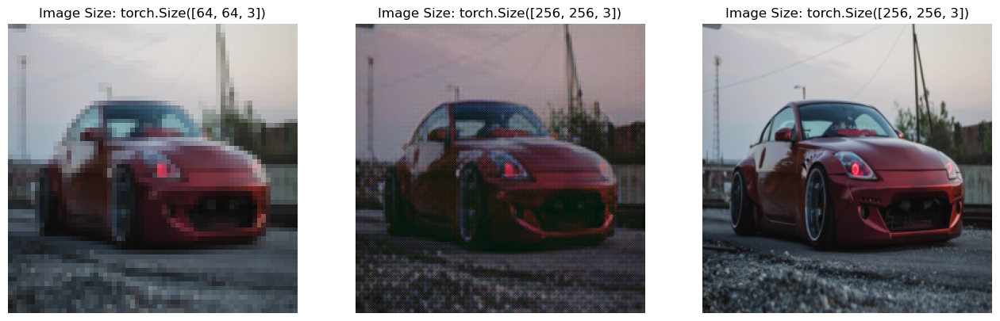

In [30]:
# generator.load_state_dict(torch.load("/kaggle/working/generator_model_epoch_10.pth"))
test_generator(model = generator, epoch = 4)

In [31]:
discriminator.output_shape

(1, 16, 16)

Epoch 1
count: 0 | dis_loss: 0.002860534703359008 | gen_loss: 0.45860755443573
count: 1 | dis_loss: 0.047445788979530334 | gen_loss: 0.529431939125061
count: 2 | dis_loss: 0.00023411748406942934 | gen_loss: 0.4481455683708191
count: 3 | dis_loss: 0.013040337711572647 | gen_loss: 0.4664252996444702
count: 4 | dis_loss: 0.0018917247653007507 | gen_loss: 0.5054532289505005
count: 5 | dis_loss: 0.002142623532563448 | gen_loss: 0.44502830505371094
count: 6 | dis_loss: 0.0018065761541947722 | gen_loss: 0.46856606006622314
count: 7 | dis_loss: 0.0005708158132620156 | gen_loss: 0.4091438055038452
count: 8 | dis_loss: 0.0007111065788194537 | gen_loss: 0.42708221077919006
count: 9 | dis_loss: 0.00040339952101930976 | gen_loss: 0.4482264816761017
count: 10 | dis_loss: 0.0010673417709767818 | gen_loss: 0.46845296025276184
count: 11 | dis_loss: 0.0007606667350046337 | gen_loss: 0.4783891439437866
count: 12 | dis_loss: 0.0005905532743781805 | gen_loss: 0.4756072461605072
count: 13 | dis_loss: 9.1660

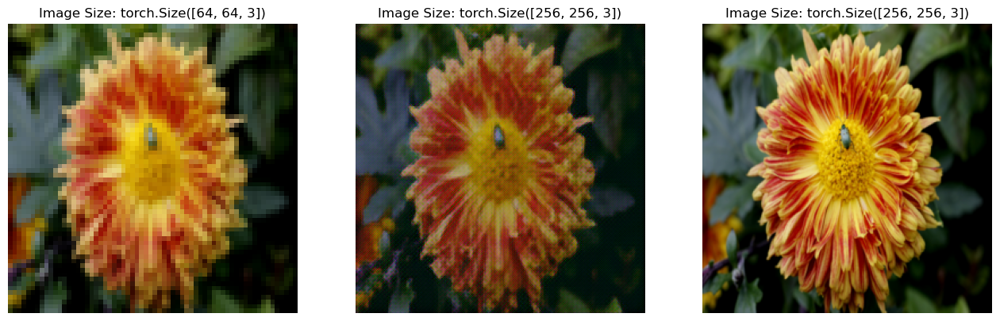

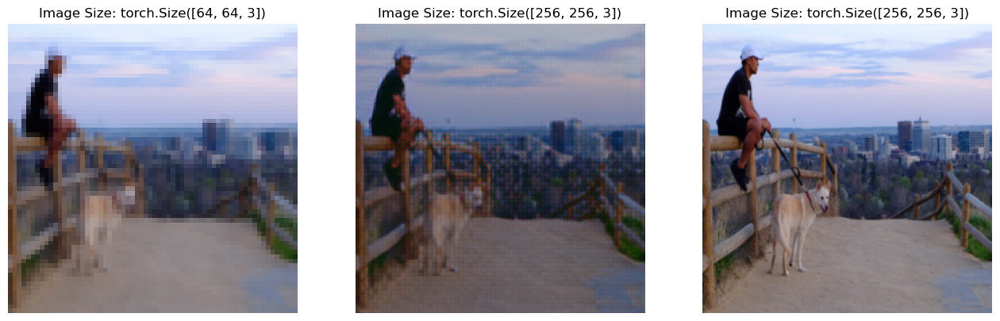

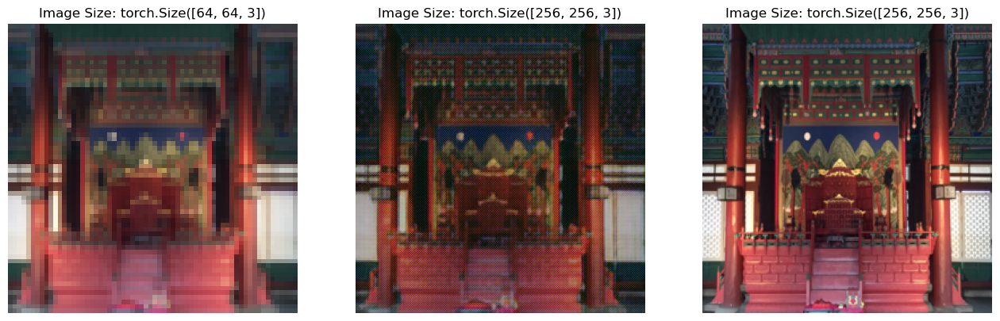

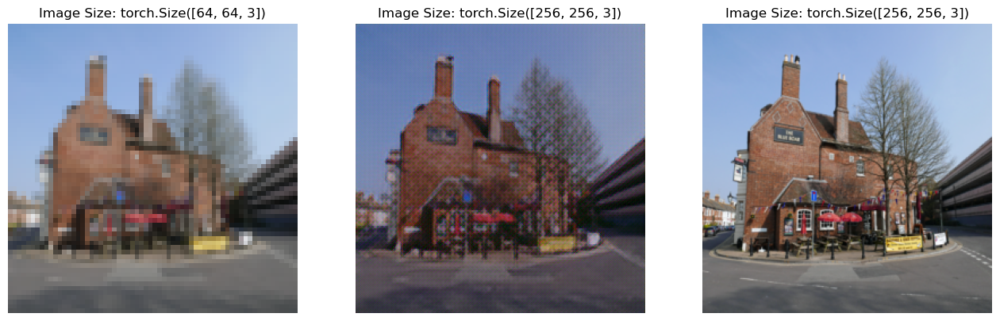

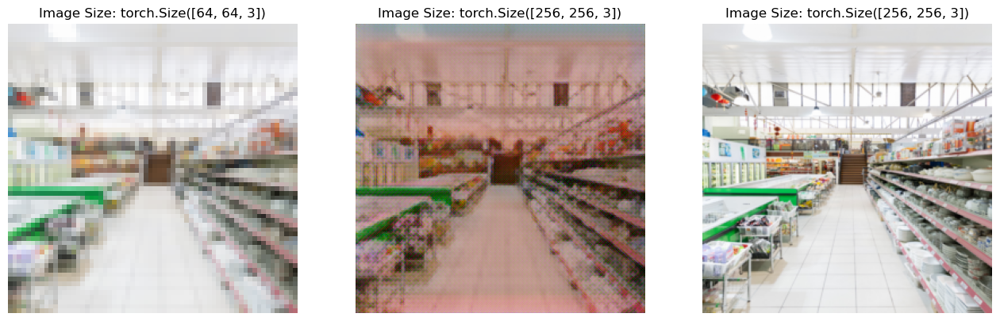

...

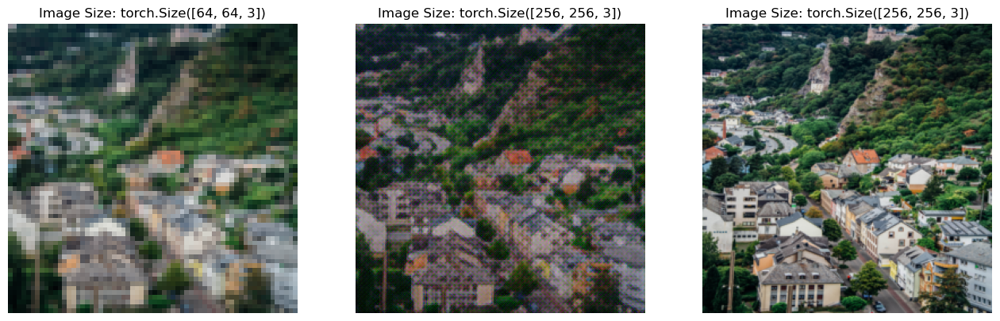

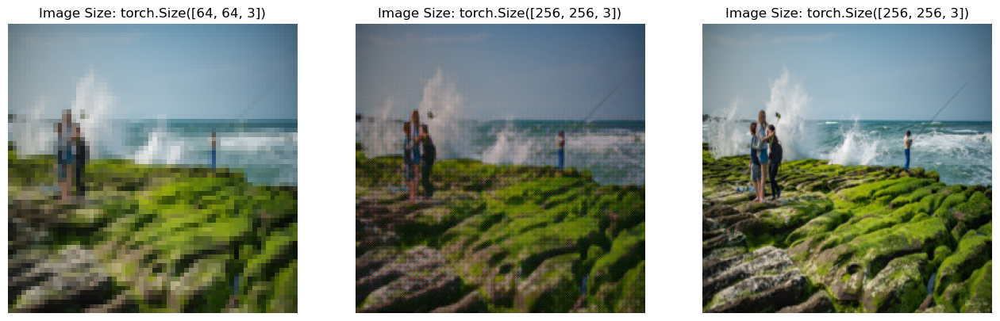

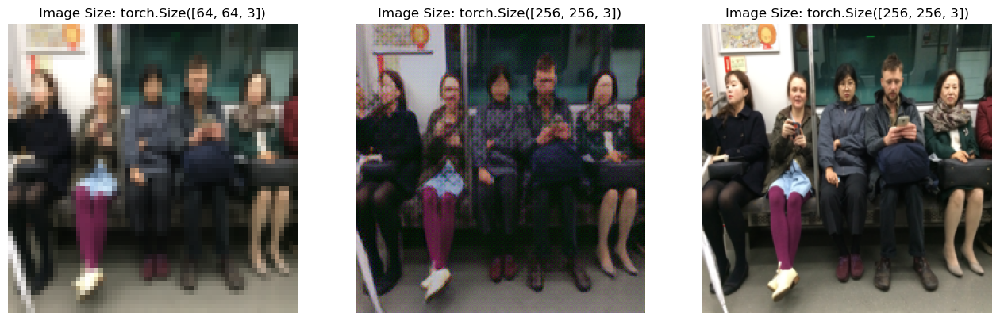

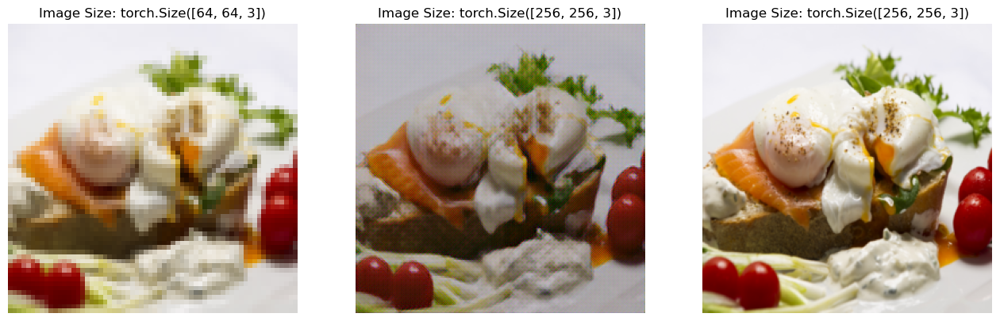

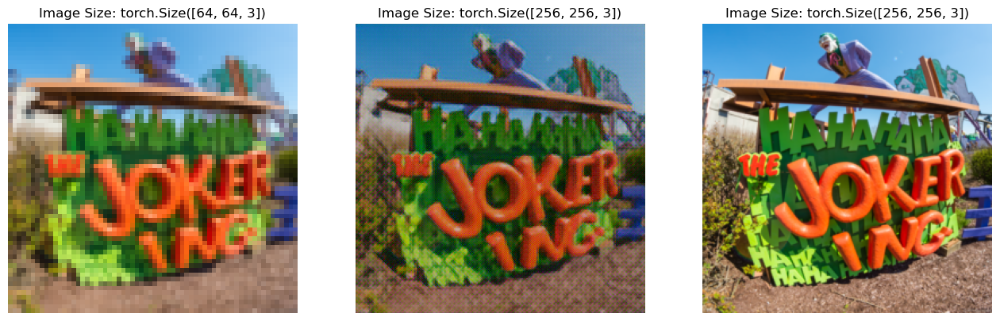

In [32]:
start_time = time.time()
for epoch in range(1, n_epochs + 1):
    print('Epoch {}'.format(epoch))
    gc.collect()
    torch.cuda.empty_cache()
    count = 0
    for i, (batch_lr, batch_hr) in enumerate(train_dataloader):
        generator.train()
        discriminator.train()
        
        imgs_real_lr = batch_lr.to(device)
        imgs_real_hr = batch_hr.to(device)
        
        real = Tensor(np.ones((imgs_real_lr.size(0), *discriminator.output_shape))).to(device)
        fake = Tensor(np.zeros((imgs_real_lr.size(0), *discriminator.output_shape))).to(device)
        
        # == Generator update == #
        optimizer_G.zero_grad()
        imgs_fake_hr = generator(imgs_real_lr)
                      
        # Adversarial Loss
        loss_gan = gan_loss(discriminator(imgs_fake_hr), real)
#       g_loss = (1/12.75) * content_loss(vgg(imgs_fake_hr), vgg(imgs_real_hr)) + 1e-3 * gan_loss(discriminator(imgs_fake_hr), real)
                      
        # Content Loss
        gen_features = feature_extracter(imgs_fake_hr)
        real_features = feature_extracter(imgs_real_hr)
        loss_content = content_loss(gen_features, real_features.detach())
        
        # Total Loss
        g_loss = loss_content + 1e-3 * loss_gan
                      
        g_loss.backward()
        optimizer_G.step()
                      
        # == Discriminator update == #
        optimizer_D.zero_grad()
                      
        loss_real = gan_loss(discriminator(imgs_real_hr), real)
        loss_fake = gan_loss(discriminator(imgs_fake_hr.detach()), fake)

        # Total loss
        d_loss = (loss_real + loss_fake) / 2               
#         imgs_fake_hr = generator(imgs_real_lr)
#         d_loss = gan_loss(discriminator(imgs_real_hr), real) + gan_loss(discriminator(imgs_fake_hr), fake)
        d_loss.backward()
        optimizer_D.step()

        # LOG PROGRESS                                    
        batches_done = epoch * len(train_dataloader) + i
        if batches_done % sample_interval == 0:      
            imgs_real_lr = nn.functional.interpolate(imgs_real_lr, scale_factor=4)
            imgs_fake_hr = make_grid(imgs_fake_hr, nrow=1, normalize=True)
            imgs_real_lr = make_grid(imgs_real_lr, nrow=1, normalize=True)
            img_grid = torch.cat((imgs_real_lr, imgs_fake_hr), -1)
            save_image(img_grid, "/kaggle/working/Images/%d.png" % batches_done, normalize=False)
            # Keep a record of losses for plotting.
            epochs.append(epoch + i/len(train_dataloader))
            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())
        print(f"count: {count} | dis_loss: {d_loss} | gen_loss: {g_loss}")
        count = count + 1 

        del imgs_real_hr
        del real
        del fake
        del imgs_fake_hr
        
    if epoch % 2 == 0:
        test_generator(generator, epoch)
    print(f"Generator Loss: {g_losses[-1]} | Disriminator Loss: {d_losses[-1]}")
    
    if epoch % 5 == 0:
        torch.save(obj = generator.state_dict(), f = "/kaggle/working/Models/generator_model_epoch_{}.pth".format(epoch))
        torch.save(obj = discriminator.state_dict(), f = "/kaggle/working/Models/discriminator_model_epoch_{}.pth".format(epoch))
        np.save("/kaggle/working/Models/gen_loss.npy", g_losses)
        np.save("/kaggle/working/Models/dis_loss.npy", d_losses)

end_time = time.time()

In [33]:
d_losses

[0.00019335580873303115,
 0.00025072117568925023,
 0.010315561667084694,
 0.0009329947642982006,
 0.0007832921110093594,
 0.0001361131580779329,
 0.002431202679872513,
 0.00017924130952451378,
 0.0002707891690079123,
 0.00013733466039411724,
 0.00031565342214889824,
 0.0008389040594920516,
 0.00039695401210337877,
 0.0006317195948213339,
 0.00019142296514473855,
 8.742311911191791e-05,
 0.0006584976217709482,
 0.00027169595705345273,
 0.0001270864886464551,
 0.00019597681239247322,
 0.00019055823213420808,
 0.0001754234981490299,
 0.0004241029382683337,
 0.0002415669587207958,
 0.0022839177399873734,
 0.0011148961493745446,
 0.0005377817433327436,
 0.0011736417654901743,
 0.004471505992114544,
 0.0009722281247377396,
 0.0020183385349810123,
 0.0006049624644219875,
 0.0009043700993061066,
 0.0018750731833279133,
 0.0014397524064406753,
 0.00045611284440383315,
 0.00038024241803213954,
 0.00039586241473443806,
 0.001101065892726183,
 0.0006933842087164521,
 0.0007620051619596779,
 0.0002

In [34]:
loaded_model = Generator()
loaded_model = nn.DataParallel(loaded_model, device_ids=[0,1])
loaded_model.to(device)

AssertionError: Invalid device id

In [ ]:
!zip -r file.zip /kaggle/working

In [ ]:
loaded_model.load_state_dict(torch.load("/kaggle/working/generator_model_epoch_10.pth"))